In [ ]:
# Inicializamos Dataset
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt


In [ ]:
# Descargar dataset de flores
datos, metadatos = tfds.load('tf_flowers', as_supervised=True, with_info=True)

In [ ]:
metadatos

tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_dir='/root/tensorflow_datasets/tf_flowers/3.0.1',
    file_format=tfrecord,
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    nondeterministic_order=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
)

,image,label
0,,2 (tulips)
1,,3 (sunflowers)
2,,3 (sunflowers)
3,,4 (roses)
4,,3 (sunflowers)

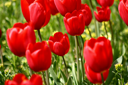
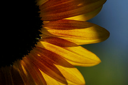
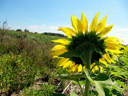
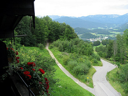
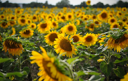

In [ ]:
tfds.as_dataframe(datos['train'].take(5), metadatos)

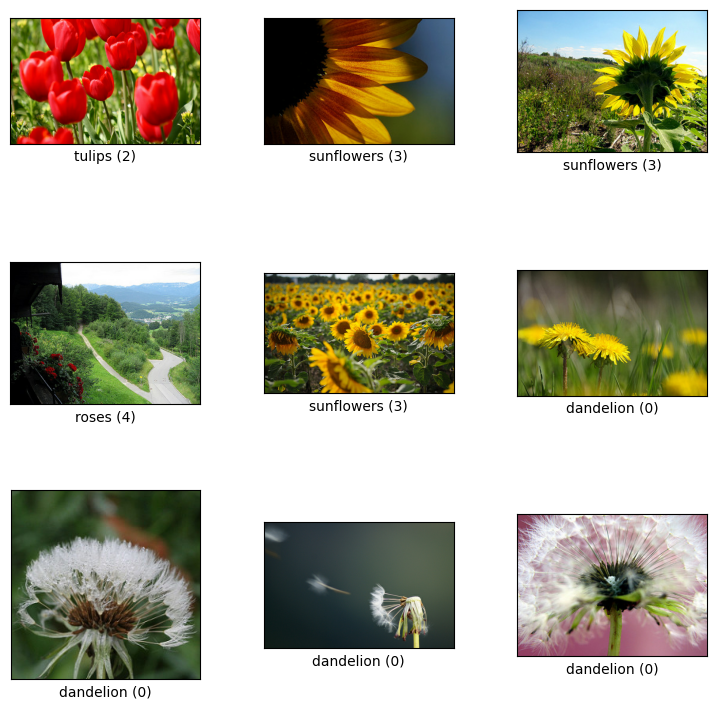

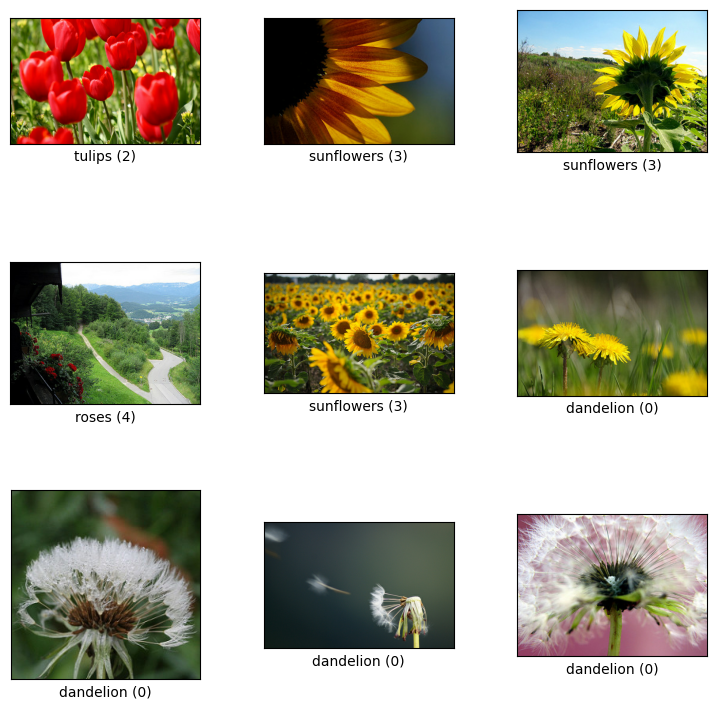

In [ ]:
tfds.show_examples(datos['train'], metadatos)

In [ ]:
# Preparar imágenes y etiquetas
TAMANO_IMG = 100

datos_entrenamiento = []

In [ ]:
# Clase 0: Flor
for imagen, etiqueta in datos['train']:
    imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
    imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1)
    datos_entrenamiento.append([imagen, 0])  # clase 0 = flor


In [ ]:
from google.colab import files
uploaded = files.upload()


Saving archive.zip to archive (1).zip


In [ ]:
import zipfile

with zipfile.ZipFile("archive.zip", 'r') as zip_ref:
    zip_ref.extractall("humanos")


In [ ]:
# Ruta base
base_dir = "humanos/human detection dataset"
TAMANO_IMG = 100
# Carga clase 1 (humanos)
for archivo in os.listdir(os.path.join(base_dir, "1")):
    path = os.path.join(base_dir, "1", archivo)
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img.reshape(TAMANO_IMG, TAMANO_IMG, 1)
        datos_entrenamiento.append([img, 1])  # clase 1 = humano

Total de imágenes de humanos cargadas: 1677


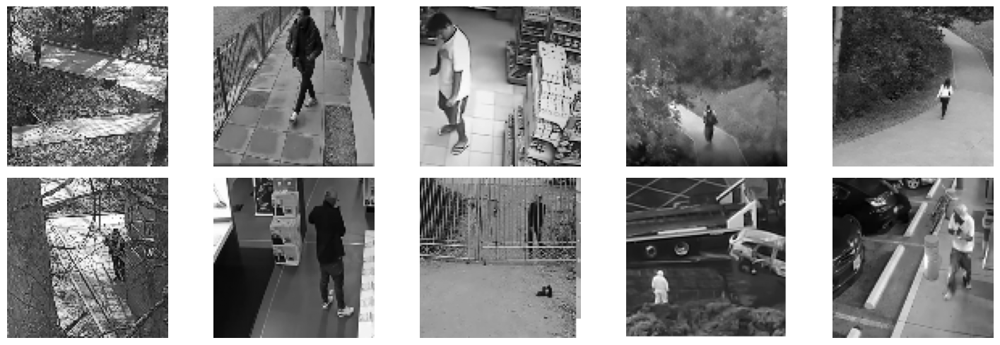

In [ ]:
imagenes_humanos = [img for img, etiqueta in datos_entrenamiento if etiqueta == 1]
print(f"Total de imágenes de humanos cargadas: {len(imagenes_humanos)}")

plt.figure(figsize=(15, 5))
for i in range(min(10, len(imagenes_humanos))):
    plt.subplot(2, 5, i+1)
    plt.imshow(imagenes_humanos[i].reshape(TAMANO_IMG, TAMANO_IMG), cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
print(f"Total de imágenes cargadas para clase humano: {len(datos_entrenamiento)}")


Total de imágenes cargadas para clase humano: 3670


In [ ]:
# Mostrar shape de la primera imagen
print(datos_entrenamiento[0][0].shape)


(100, 100, 1)


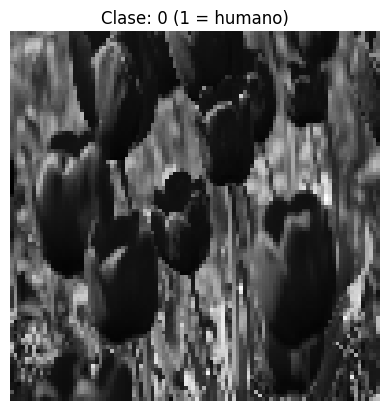

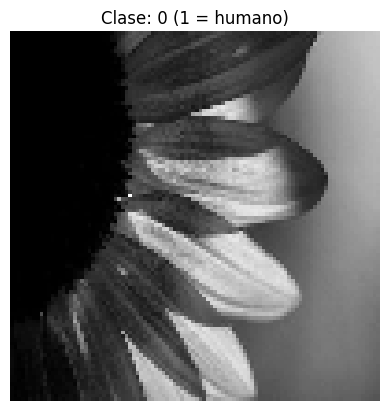

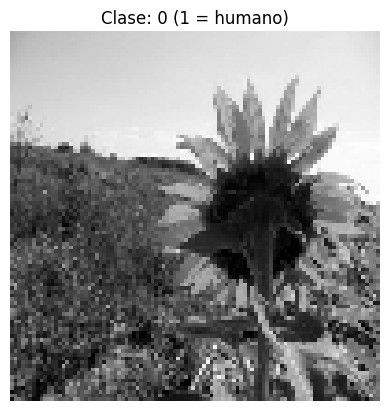

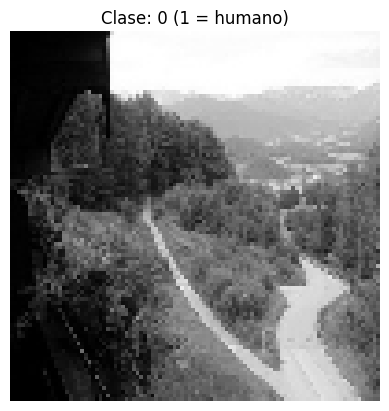

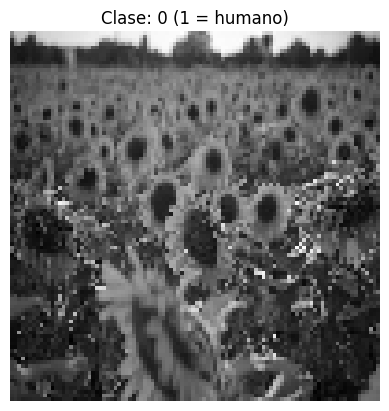

In [ ]:
import matplotlib.pyplot as plt

for i in range(5):  # Mostrar las primeras 5 imágenes
    img, label = datos_entrenamiento[i]
    plt.imshow(img.squeeze(), cmap='gray')
    plt.title(f"Clase: {label} (1 = humano)")
    plt.axis('off')
    plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Filtrar solo imágenes con etiqueta 1 (humanos)
imagenes_humanos = [img for img, etiqueta in datos_entrenamiento if etiqueta == 1]

# Ver cuántas imágenes humanas se han cargado
print(f"Total de imágenes de humanos cargadas: {len(imagenes_humanos)}")

# Mostrar las primeras 10 imágenes humanas
plt.figure(figsize=(15, 5))
for i in range(min(10, len(imagenes_humanos))):
    plt.subplot(2, 5, i+1)
    plt.imshow(imagenes_humanos[i].reshape(TAMANO_IMG, TAMANO_IMG), cmap='gray')
    plt.title("Humano")
    plt.axis('off')
plt.tight_layout()
plt.show()


Total de imágenes de humanos cargadas: 0


<Figure size 1500x500 with 0 Axes>

In [ ]:
import os

# Mostrar los archivos dentro de "humanos"
for raiz, carpetas, archivos in os.walk("humanos"):
    print(f"Ruta: {raiz}, Archivos: {len(archivos)}")
    for archivo in archivos[:5]:  # Muestra los primeros 5
        print(" -", archivo)


Ruta: humanos, Archivos: 0
Ruta: humanos/human detection dataset, Archivos: 0
Ruta: humanos/human detection dataset/0, Archivos: 362
 - 143.png
 - 52.png
 - 48.png
 - 346.png
 - 167.png
Ruta: humanos/human detection dataset/1, Archivos: 559
 - 143.png
 - 52.png
 - 48.png
 - 346.png
 - 427.png


In [ ]:
print(datos_entrenamiento[0][0][:5, :5, 0])  # Ver primeros 5x5 píxeles


[[ 95 111  97  93  84]
 [108 113 107 102 107]
 [109 114 120 116 130]
 [ 97 116 134 128 173]
 [115 143 147 129 197]]


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Limpia datos_entrenamiento si ya contiene flores
# datos_entrenamiento = []  # Solo si quieres reiniciar todo

# Ruta base
base_dir = "humanos/human detection dataset"
TAMANO_IMG = 100

# Carga clase 0 (no humanos)
for archivo in os.listdir(os.path.join(base_dir, "0")):
    path = os.path.join(base_dir, "0", archivo)
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img.reshape(TAMANO_IMG, TAMANO_IMG, 1)
        datos_entrenamiento.append([img, 0])  # clase 0 = no humano

# Carga clase 1 (humanos)
for archivo in os.listdir(os.path.join(base_dir, "1")):
    path = os.path.join(base_dir, "1", archivo)
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (TAMANO_IMG, TAMANO_IMG))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = img.reshape(TAMANO_IMG, TAMANO_IMG, 1)
        datos_entrenamiento.append([img, 1])  # clase 1 = humano


Total de imágenes de humanos cargadas: 559


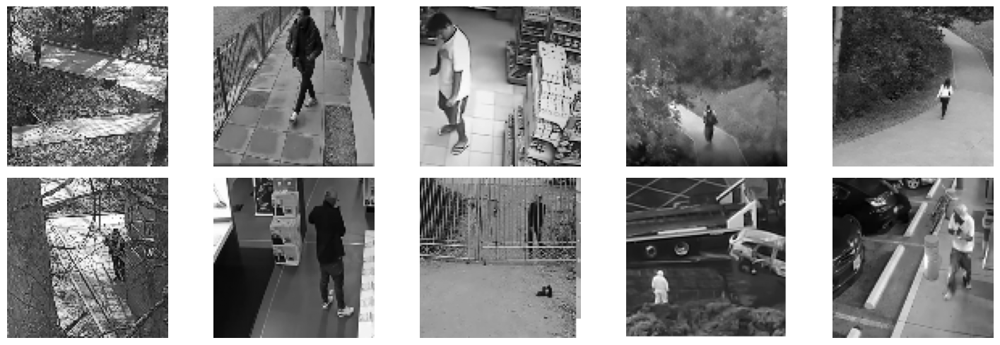

In [ ]:
imagenes_humanos = [img for img, etiqueta in datos_entrenamiento if etiqueta == 1]
print(f"Total de imágenes de humanos cargadas: {len(imagenes_humanos)}")

plt.figure(figsize=(15, 5))
for i in range(min(10, len(imagenes_humanos))):
    plt.subplot(2, 5, i+1)
    plt.imshow(imagenes_humanos[i].reshape(TAMANO_IMG, TAMANO_IMG), cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:

# Mezclar y separar datos
import random
random.shuffle(datos_entrenamiento)

x, y = [], []
for imagen, etiqueta in datos_entrenamiento:
    x.append(imagen)
    y.append(etiqueta)

x = np.array(x).astype('float32') / 255.0
y = np.array(y)

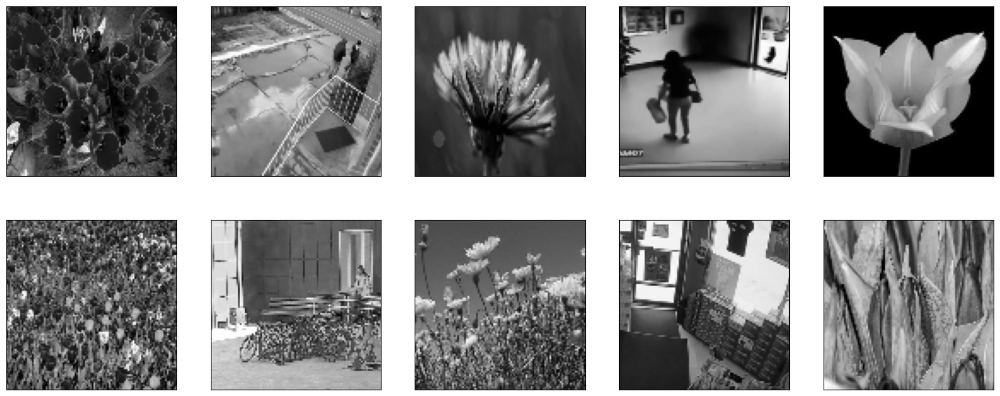

In [ ]:

# Visualización de muestras
plt.figure(figsize=(20, 8))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(x[i].reshape(TAMANO_IMG, TAMANO_IMG), cmap='gray')

In [ ]:
# Importar generador con aumento de datos
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=15,
    zoom_range=[0.7, 1.4],
    horizontal_flip=True,
    vertical_flip=True
)
datagen.fit(x)


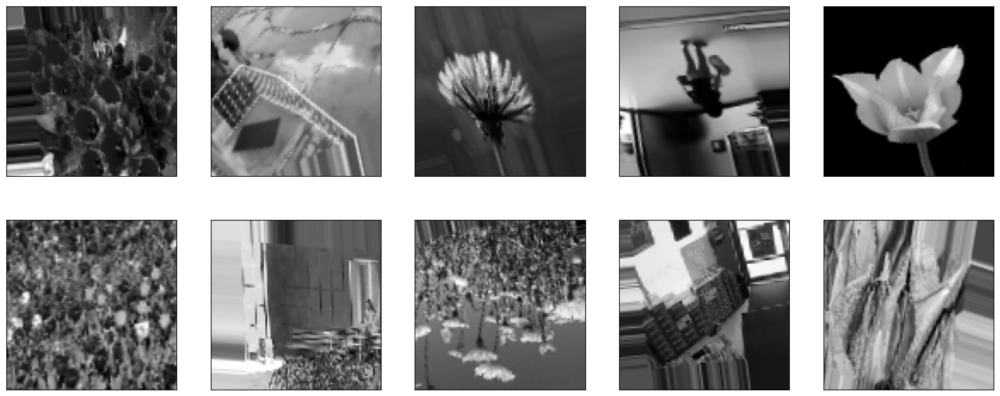

In [ ]:
# Mostrar ejemplos aumentados
plt.figure(figsize=(20, 8))
for imagen, etiqueta in datagen.flow(x, y, batch_size=10, shuffle=False):
    for i in range(10):
        plt.subplot(2, 5, i+1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(imagen[i].reshape(TAMANO_IMG, TAMANO_IMG), cmap='gray')
    break


In [ ]:

# Arquitectura CNN
from tensorflow.keras import layers, models, Input

input_layer = Input(shape=(TAMANO_IMG, TAMANO_IMG, 1))

x_arq = layers.Conv2D(32, (3, 3), activation='relu')(input_layer)
x_arq = layers.MaxPooling2D(2, 2)(x_arq)
x_arq = layers.Conv2D(64, (3, 3), activation='relu')(x_arq)
x_arq = layers.MaxPooling2D(2, 2)(x_arq)
x_arq = layers.Conv2D(128, (3, 3), activation='relu')(x_arq)
x_arq = layers.MaxPooling2D(2, 2)(x_arq)
x_arq = layers.Flatten()(x_arq)
x_arq = layers.Dense(100, activation='relu')(x_arq)
output_layer = layers.Dense(1, activation='sigmoid')(x_arq)

modeloCNN_AD = models.Model(inputs=input_layer, outputs=output_layer)
modeloCNN_AD.compile(optimizer='adam',
                     loss='binary_crossentropy',
                     metrics=['accuracy'])


In [ ]:

# División del dataset
total = len(x)
entrenamiento_size = int(total * 0.85)

x_entrenamiento = x[:entrenamiento_size]
x_validacion = x[entrenamiento_size:]
y_entrenamiento = y[:entrenamiento_size]
y_validacion = y[entrenamiento_size:]

data_gen_entrenamiento = datagen.flow(x_entrenamiento, y_entrenamiento, batch_size=32)

In [ ]:

# Entrenamiento
from tensorflow.keras.callbacks import TensorBoard

tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=10,
    batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(x_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


162/162 ━━━━━━━━━━━━━━━━━━━━ 103s 617ms/step - accuracy: 0.7207 - loss: 0.5662 - val_accuracy: 0.7398 - val_loss: 0.4900
Epoch 2/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 138s 600ms/step - accuracy: 0.7140 - loss: 0.5286 - val_accuracy: 0.7398 - val_loss: 0.4718
Epoch 3/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 141s 595ms/step - accuracy: 0.7118 - loss: 0.5183 - val_accuracy: 0.7728 - val_loss: 0.4529
Epoch 4/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 96s 595ms/step - accuracy: 0.7484 - loss: 0.4830 - val_accuracy: 0.7914 - val_loss: 0.4236
Epoch 5/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 142s 597ms/step - accuracy: 0.7511 - loss: 0.4875 - val_accuracy: 0.8145 - val_loss: 0.4151
Epoch 6/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 140s 583ms/step - accuracy: 0.7472 - loss: 0.4768 - val_accuracy: 0.8386 - val_loss: 0.3838
Epoch 7/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 141s 579ms/step - accuracy: 0.7712 - loss: 0.4671 - val_accuracy: 0.8430 - val_loss: 0.3950
Epoch 8/10
162/162 ━━━━━━━━━━━━━━━━━━━━ 95s 586ms/step - accuracy: 0.7826 - loss: 0.4364

In [ ]:

# TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:

# Exportar modelo
modeloCNN_AD.export("modelo_terminado")


Saved artifact at 'modelo_terminado'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 100, 100, 1), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 1), dtype=tf.float32, name=None)
Captures:
  131929146941776: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146942736: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146939664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146940048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146938128: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146938320: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146942544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146937936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146938896: TensorSpec(shape=(), dtype=tf.resource, name=None)
  131929146935248: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [ ]:

# Conversión a TensorFlow.js
!pip install tensorflowjs
!mkdir gaaaaa
!tensorflowjs_converter \
  --input_format=tf_saved_model \
  --output_format=tfjs_graph_model \
  modelo_terminado gaaaaa

2025-06-13 14:38:51.538019: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749825531.574030   34571 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749825531.585275   34571 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2025-06-13 14:38:58.110228: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
I0000 00:00:1749825538.265473   34571 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0
I0000 00:00